In [16]:
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime
from pykalman import KalmanFilter
from statsmodels.nonparametric.smoothers_lowess import lowess
from scipy import signal
import scipy.fftpack
from mpl_toolkits.mplot3d import Axes3D

Comments


In [17]:
walk1=pd.read_csv("data/rawdata/walking/walk1.csv")
walk1['Activity']='1'
walk2=pd.read_csv("data/rawdata/walking/walk2.csv")
walk2['Activity']='1'
walk3=pd.read_csv("data/rawdata/walking/walk3.csv")
walk3['Activity']='1'
walk4=pd.read_csv("data/rawdata/walking/walk4.csv")
walk4['Activity']='1'
walk5=pd.read_csv("data/rawdata/walking/walk5.csv")
walk5['Activity']='1'
walk6=pd.read_csv("data/rawdata/walking/walk6.csv")
walk6['Activity']='1'
walk7=pd.read_csv("data/rawdata/walking/walk7.csv")
walk7['Activity']='1'
walk8=pd.read_csv("data/rawdata/walking/walk8.csv")
walk8['Activity']='1'
walk9=pd.read_csv("data/rawdata/walking/walk9.csv")
walk9['Activity']='1'
walk10=pd.read_csv("data/rawdata/walking/walk10.csv")
walk10['Activity']='1'

walk11=pd.read_csv("data/rawdata/walking/walk11.csv")
walk11['Activity']='1'
walk12=pd.read_csv("data/rawdata/walking/walk12.csv")
walk12['Activity']='1'
walk13=pd.read_csv("data/rawdata/walking/walk13.csv")
walk13['Activity']='1'
walk14=pd.read_csv("data/rawdata/walking/walk14.csv")
walk14['Activity']='1'
walk15=pd.read_csv("data/rawdata/walking/walk15.csv")
walk15['Activity']='1'
walk16=pd.read_csv("data/rawdata/walking/walk16.csv")
walk16['Activity']='1'
walk17=pd.read_csv("data/rawdata/walking/walk17.csv")
walk17['Activity']='1'
walk18=pd.read_csv("data/rawdata/walking/walk18.csv")
walk18['Activity']='1'
walk19=pd.read_csv("data/rawdata/walking/walk19.csv")
walk19['Activity']='1'
walk20=pd.read_csv("data/rawdata/walking/walk20.csv")
walk20['Activity']='1'

walk21=pd.read_csv("data/rawdata/walking/walk21.csv")
walk21['Activity']='1'
walk22=pd.read_csv("data/rawdata/walking/walk22.csv")
walk22['Activity']='1'
walk23=pd.read_csv("data/rawdata/walking/walk23.csv")
walk23['Activity']='1'
walk24=pd.read_csv("data/rawdata/walking/walk24.csv")
walk24['Activity']='1'
walk25=pd.read_csv("data/rawdata/walking/walk25.csv")
walk25['Activity']='1'
walk26=pd.read_csv("data/rawdata/walking/walk26.csv")
walk26['Activity']='1'
walk27=pd.read_csv("data/rawdata/walking/walk27.csv")
walk27['Activity']='1'
walk28=pd.read_csv("data/rawdata/walking/walk28.csv")
walk28['Activity']='1'
walk29=pd.read_csv("data/rawdata/walking/walk29.csv")
walk29['Activity']='1'
walk30=pd.read_csv("data/rawdata/walking/walk30.csv")
walk30['Activity']='1'




In [18]:
walkdf=[walk1,walk2,walk3,walk4,walk5,walk6,walk7,walk8,walk9,walk10,walk11,walk12,walk13,walk14,walk15,walk16,walk17,walk18,walk19,walk20,walk21,walk22,walk23,walk24,walk25,walk26,walk27,walk28,walk29,walk30]
walkdf

[         time    gFx    gFy    gFz    acc Activity
 0     50:58.7 -0.030 -0.200 -0.809  0.834        1
 1     50:58.7 -0.003 -0.233 -0.854  0.885        1
 2     50:58.7 -0.038 -0.330 -0.879  0.940        1
 3     50:58.8 -0.074 -0.390 -0.885  0.970        1
 4     50:58.8 -0.123 -0.459 -1.032  1.136        1
 ...       ...    ...    ...    ...    ...      ...
 1832  51:25.5 -0.173 -0.348 -1.047  1.117        1
 1833  51:25.5 -0.173 -0.348 -1.047  1.117        1
 1834  51:25.5 -0.167 -0.333 -1.070  1.133        1
 1835  51:25.5 -0.167 -0.333 -1.070  1.133        1
 1836  51:25.5 -0.161 -0.329 -1.074  1.135        1
 
 [1837 rows x 6 columns],
          time    gFx    gFy    gFz    acc Activity
 0     51:35.0  0.031 -0.279 -0.878  0.922        1
 1     51:35.0  0.031 -0.279 -0.878  0.922        1
 2     51:35.0  0.064 -0.287 -0.925  0.971        1
 3     51:35.0  0.098 -0.312 -0.944  0.999        1
 4     51:35.0  0.111 -0.325 -0.936  0.997        1
 ...       ...    ...    ...    ... 

In [19]:
standing1=pd.read_csv("data/rawdata/standing/standing1.csv")
standing1['Activity']='0'
standing2=pd.read_csv("data/rawdata/standing/standing2.csv")
standing2['Activity']='0'
standing3=pd.read_csv("data/rawdata/standing/standing3.csv")
standing3['Activity']='0'
standing4=pd.read_csv("data/rawdata/standing/standing4.csv")
standing4['Activity']='0'
standing5=pd.read_csv("data/rawdata/standing/standing5.csv")
standing5['Activity']='0'
standing6=pd.read_csv("data/rawdata/standing/standing6.csv")
standing6['Activity']='0'
standing7=pd.read_csv("data/rawdata/standing/standing7.csv")
standing7['Activity']='0'
standing8=pd.read_csv("data/rawdata/standing/standing8.csv")
standing8['Activity']='0'
standing9=pd.read_csv("data/rawdata/standing/standing9.csv")
standing9['Activity']='0'
standing10=pd.read_csv("data/rawdata/standing/standing10.csv")
standing10['Activity']='0'


standing11=pd.read_csv("data/rawdata/standing/standing11.csv")
standing11['Activity']='0'
standing12=pd.read_csv("data/rawdata/standing/standing12.csv")
standing12['Activity']='0'
standing13=pd.read_csv("data/rawdata/standing/standing13.csv")
standing13['Activity']='0'
standing14=pd.read_csv("data/rawdata/standing/standing14.csv")
standing14['Activity']='0'
standing15=pd.read_csv("data/rawdata/standing/standing15.csv")
standing15['Activity']='0'
standing16=pd.read_csv("data/rawdata/standing/standing16.csv")
standing16['Activity']='0'
standing17=pd.read_csv("data/rawdata/standing/standing17.csv")
standing17['Activity']='0'
standing18=pd.read_csv("data/rawdata/standing/standing18.csv")
standing18['Activity']='0'
standing19=pd.read_csv("data/rawdata/standing/standing19.csv")
standing19['Activity']='0'
standing20=pd.read_csv("data/rawdata/standing/standing20.csv")
standing20['Activity']='0'



standing21=pd.read_csv("data/rawdata/standing/standing21.csv")
standing21['Activity']='0'
standing22=pd.read_csv("data/rawdata/standing/standing22.csv")
standing22['Activity']='0'
standing23=pd.read_csv("data/rawdata/standing/standing23.csv")
standing23['Activity']='0'
standing24=pd.read_csv("data/rawdata/standing/standing24.csv")
standing24['Activity']='0'
standing25=pd.read_csv("data/rawdata/standing/standing25.csv")
standing25['Activity']='0'
standing26=pd.read_csv("data/rawdata/standing/standing26.csv")
standing26['Activity']='0'
standing27=pd.read_csv("data/rawdata/standing/standing27.csv")
standing27['Activity']='0'
standing28=pd.read_csv("data/rawdata/standing/standing28.csv")
standing28['Activity']='0'
standing29=pd.read_csv("data/rawdata/standing/standing29.csv")
standing29['Activity']='0'
standing30=pd.read_csv("data/rawdata/standing/standing30.csv")
standing30['Activity']='0'







In [20]:
standingdf=[standing1,standing2,standing3,standing4,standing5,standing6,standing7,standing8,standing9,standing10,standing11,standing12,standing13,standing14,standing15,standing16,standing17,standing18,standing19,standing20,standing21,standing22,standing22,standing23,standing24,standing25,standing26,standing27,standing28,standing29,standing30]
standingdf


[         time    gFx    gFy    gFz    acc Activity
 0     56:10.0  0.025 -0.418 -0.854  0.951        0
 1     56:10.0  0.016 -0.395 -0.870  0.956        0
 2     56:10.0  0.025 -0.408 -0.925  1.011        0
 3     56:10.1  0.033 -0.442 -0.944  1.043        0
 4     56:10.1  0.032 -0.444 -0.952  1.051        0
 ...       ...    ...    ...    ...    ...      ...
 1735  56:27.3  0.000 -0.400 -0.923  1.006        0
 1736  56:27.3  0.000 -0.400 -0.923  1.006        0
 1737  56:27.3  0.003 -0.399 -0.926  1.008        0
 1738  56:27.3  0.005 -0.399 -0.928  1.010        0
 1739  56:27.3  0.006 -0.398 -0.926  1.008        0
 
 [1740 rows x 6 columns],
          time    gFx    gFy    gFz    acc Activity
 0     56:47.1  0.009 -0.168 -1.025  1.039        0
 1     56:47.1  0.016 -0.169 -1.036  1.050        0
 2     56:47.1  0.017 -0.178 -1.037  1.052        0
 3     56:47.2 -0.007 -0.193 -0.997  1.016        0
 4     56:47.2 -0.007 -0.193 -0.997  1.016        0
 ...       ...    ...    ...    ... 

In [21]:
running1=pd.read_csv("data/rawdata/running/running1.csv")
running1['Activity']='2'
running2=pd.read_csv("data/rawdata/running/running2.csv")
running2['Activity']='2'
running3=pd.read_csv("data/rawdata/running/running3.csv")
running3['Activity']='2'
running4=pd.read_csv("data/rawdata/running/running4.csv")
running4['Activity']='2'
running5=pd.read_csv("data/rawdata/running/running5.csv")
running5['Activity']='2'
running6=pd.read_csv("data/rawdata/running/running6.csv")
running6['Activity']='2'
running7=pd.read_csv("data/rawdata/running/running7.csv")
running7['Activity']='2'
running8=pd.read_csv("data/rawdata/running/running8.csv")
running8['Activity']='2'
running9=pd.read_csv("data/rawdata/running/running9.csv")
running9['Activity']='2'
running10=pd.read_csv("data/rawdata/running/running10.csv")
running10['Activity']='2'


running11=pd.read_csv("data/rawdata/running/running11.csv")
running11['Activity']='2'
running12=pd.read_csv("data/rawdata/running/running12.csv")
running12['Activity']='2'
running13=pd.read_csv("data/rawdata/running/running13.csv")
running13['Activity']='2'
running14=pd.read_csv("data/rawdata/running/running14.csv")
running14['Activity']='2'
running15=pd.read_csv("data/rawdata/running/running15.csv")
running15['Activity']='2'
running16=pd.read_csv("data/rawdata/running/running16.csv")
running16['Activity']='2'
running17=pd.read_csv("data/rawdata/running/running17.csv")
running17['Activity']='2'
running18=pd.read_csv("data/rawdata/running/running18.csv")
running18['Activity']='2'
running19=pd.read_csv("data/rawdata/running/running19.csv")
running19['Activity']='2'
running20=pd.read_csv("data/rawdata/running/running20.csv")
running20['Activity']='2'


running21=pd.read_csv("data/rawdata/running/running21.csv")
running21['Activity']='2'
running22=pd.read_csv("data/rawdata/running/running22.csv")
running22['Activity']='2'
running23=pd.read_csv("data/rawdata/running/running23.csv")
running23['Activity']='2'
running24=pd.read_csv("data/rawdata/running/running24.csv")
running24['Activity']='2'
running25=pd.read_csv("data/rawdata/running/running25.csv")
running25['Activity']='2'
running26=pd.read_csv("data/rawdata/running/running26.csv")
running26['Activity']='2'
running27=pd.read_csv("data/rawdata/running/running27.csv")
running27['Activity']='2'
running28=pd.read_csv("data/rawdata/running/running28.csv")
running28['Activity']='2'
running29=pd.read_csv("data/rawdata/running/running29.csv")
running29['Activity']='2'
running30=pd.read_csv("data/rawdata/running/running30.csv")
running30['Activity']='2'






In [22]:
runningdf=[running1,running2,running3,running4,running5,running6,running7,running8,running9,running10,running11,running12,running13,running14,running15,running16,running17,running18,running19,running20,running21,running22,running23,running24,running25,running26,running27,running28,running29,running30]
runningdf

[        time    gFx    gFy    gFz    acc Activity
 0    05:47.3  0.004 -0.371 -0.446  0.580        2
 1    05:47.3  0.004 -0.371 -0.446  0.580        2
 2    05:47.3  0.072 -0.441 -0.490  0.663        2
 3    05:47.3  0.102 -0.469 -0.476  0.676        2
 4    05:47.4  0.085 -0.464 -0.471  0.667        2
 ..       ...    ...    ...    ...    ...      ...
 723  06:01.5 -0.344 -0.336 -0.823  0.953        2
 724  06:01.5 -0.346 -0.334 -0.895  1.016        2
 725  06:01.6 -0.336 -0.434 -0.943  1.091        2
 726  06:01.6 -0.331 -0.527 -1.000  1.178        2
 727  06:01.6 -0.384 -0.537 -0.986  1.187        2
 
 [728 rows x 6 columns],
         time    gFx    gFy    gFz    acc Activity
 0    09:13.1  0.062 -0.366 -1.703  1.743        2
 1    09:13.1  0.076 -0.358 -1.667  1.707        2
 2    09:13.1  0.092 -0.345 -1.607  1.646        2
 3    09:13.2  0.116 -0.305 -1.570  1.604        2
 4    09:13.2  0.117 -0.297 -1.419  1.454        2
 ..       ...    ...    ...    ...    ...      ...
 866

In [23]:

#using low pass filter 
b, a = signal.butter(3, 0.1, btype='lowpass', analog=False)

walk_np=list(walkdf)
standing_np=list(standingdf)
running_np=list(runningdf)


In [27]:
butter_worth_walk = []
for i in range(30):
    butter_worth_walkX = signal.filtfilt(b, a, walk_np[i]["gFx"])
    butter_worth_walkY = signal.filtfilt(b, a, walk_np[i]["gFy"])
    butter_worth_walkZ = signal.filtfilt(b, a, walk_np[i]["gFz"])
    #butter_worth_walk_L =signal.filtfilt(b, a,walk_np[i]["acc"])
    
    
    butter_worth_walk.append((pd.DataFrame(list(zip(walk_np[i]['time'],butter_worth_walkX, butter_worth_walkY, butter_worth_walkZ,walk_np[i]['acc'])),
                                            columns=["Time","AccX", "AccY", "AccZ","Acc-old"])))
    
    
    
    
   
    
    

,Time,AccX,AccY,AccZ,Acc-old
0,32:49.9,-0.060226,-0.338495,-1.247155,1.293
1,32:49.9,-0.063457,-0.337941,-1.248299,1.320
2,32:49.9,-0.066101,-0.336349,-1.248712,1.315
3,32:49.9,-0.067490,-0.332815,-1.247591,1.308
4,32:49.9,-0.067072,-0.326718,-1.244219,1.311
...,...,...,...,...,...
2593,33:15.9,-0.002890,-0.164660,-0.831156,0.904
2594,33:15.9,-0.002282,-0.167122,-0.827913,0.901
2595,33:15.9,-0.003913,-0.170719,-0.822926,0.888
2596,33:15.9,-0.007381,-0.175194,-0.816356,0.829


In [31]:
for i in range(30):
    butter_worth_walk[i]["Acc-trns"] = np.sqrt(butter_worth_walk[i]["AccX"]**2 * 
                                                     butter_worth_walk[i]["AccY"]**2 *
                                                     butter_worth_walk[i]["AccZ"]**2 ) 
    
butter_worth_walk[0]

,Time,AccX,AccY,AccZ,Acc-old,Acc-trns
0,50:58.7,-0.034059,-0.193109,-0.792666,0.834,0.005214
1,50:58.7,-0.054152,-0.217680,-0.793732,0.885,0.009356
2,50:58.7,-0.072244,-0.240606,-0.794303,0.940,0.013807
3,50:58.8,-0.086890,-0.260312,-0.793582,0.970,0.017950
4,50:58.8,-0.096815,-0.275805,-0.791350,1.136,0.021131
...,...,...,...,...,...,...
1832,51:25.5,-0.139699,-0.451786,-1.018895,1.117,0.064306
1833,51:25.5,-0.146444,-0.419644,-1.031833,1.117,0.063411
1834,51:25.5,-0.152605,-0.387077,-1.045610,1.133,0.061764
1835,51:25.5,-0.158078,-0.354912,-1.059830,1.133,0.059461


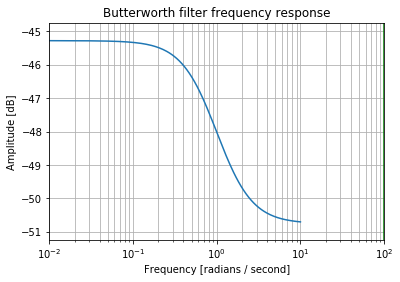

In [32]:

########Walking data########
w, h = signal.freqs(b, a)
plt.semilogx(w, 20 * np.log10(abs(h)))
plt.title('Butterworth filter frequency response')
plt.xlabel('Frequency [radians / second]')
plt.ylabel('Amplitude [dB]')
plt.margins(0, 0.1)
plt.grid(which='both', axis='both')
plt.axvline(100, color='green') # cutoff frequency
plt.show()


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max

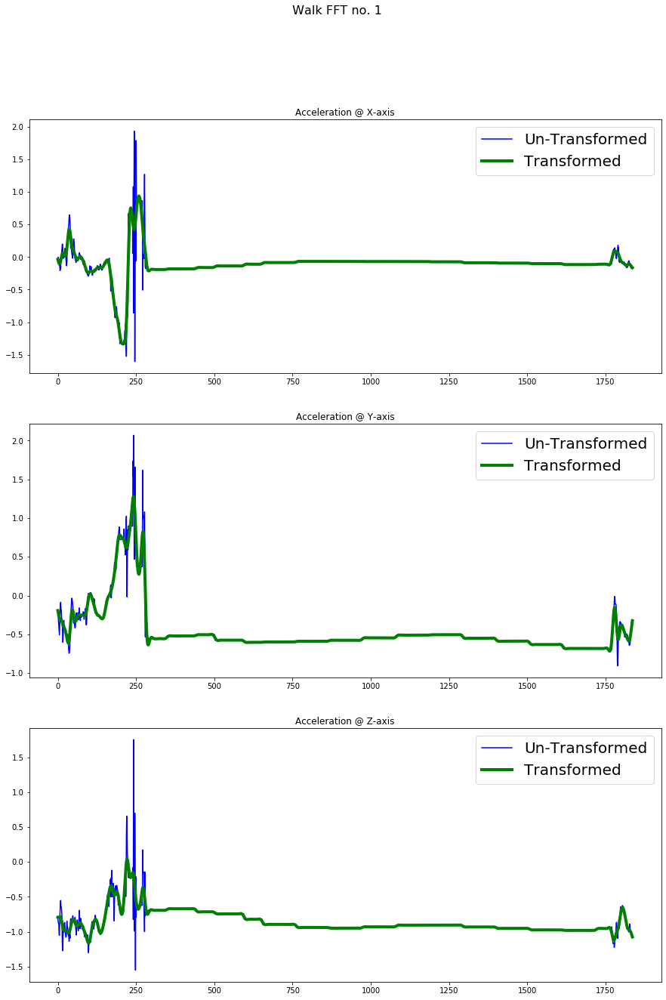

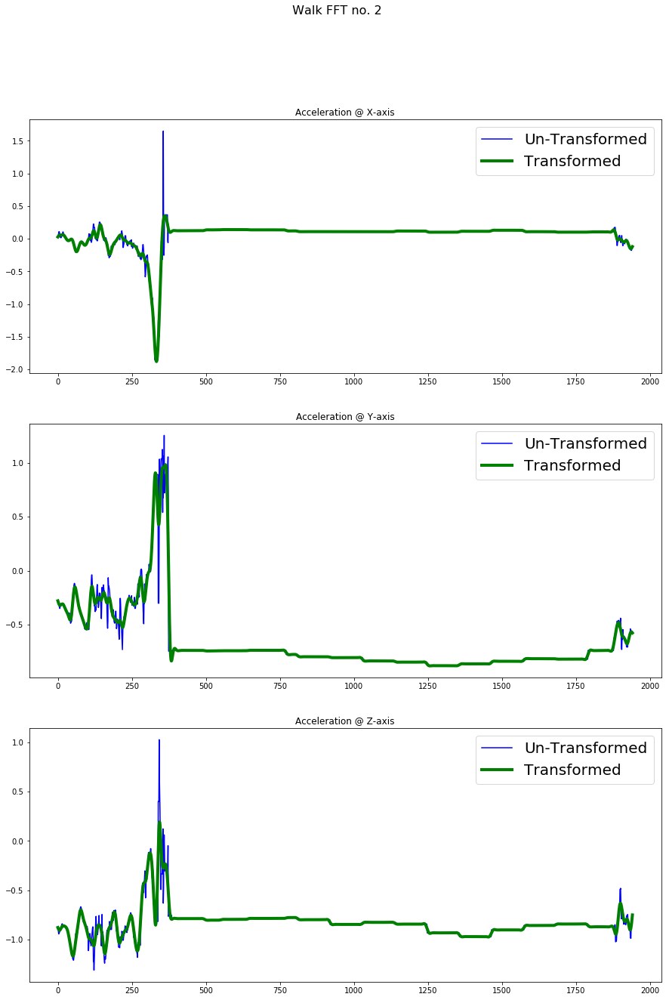

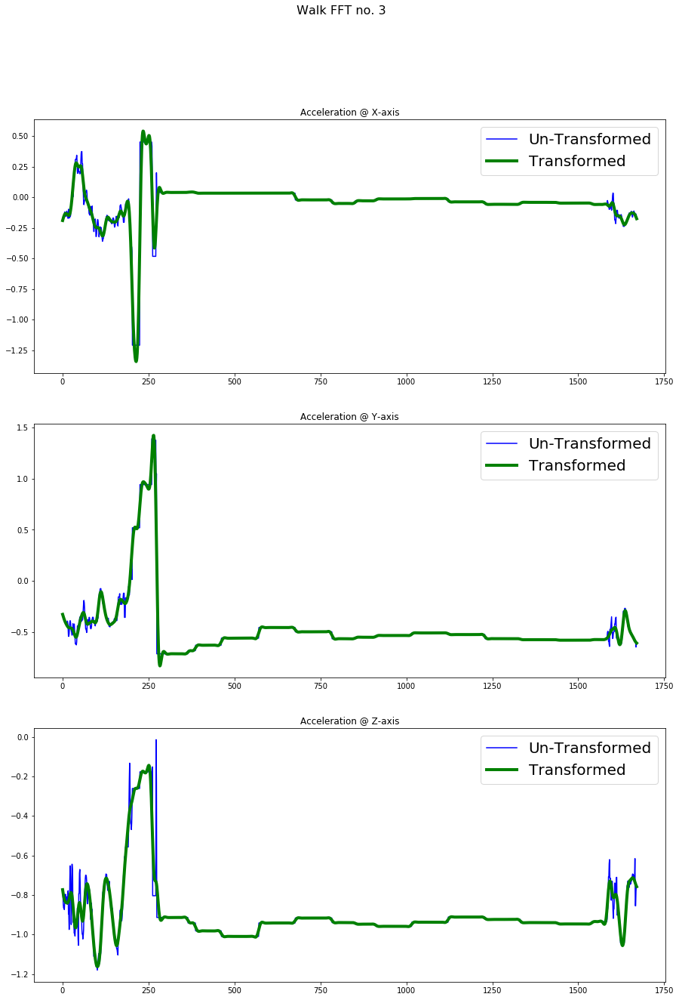

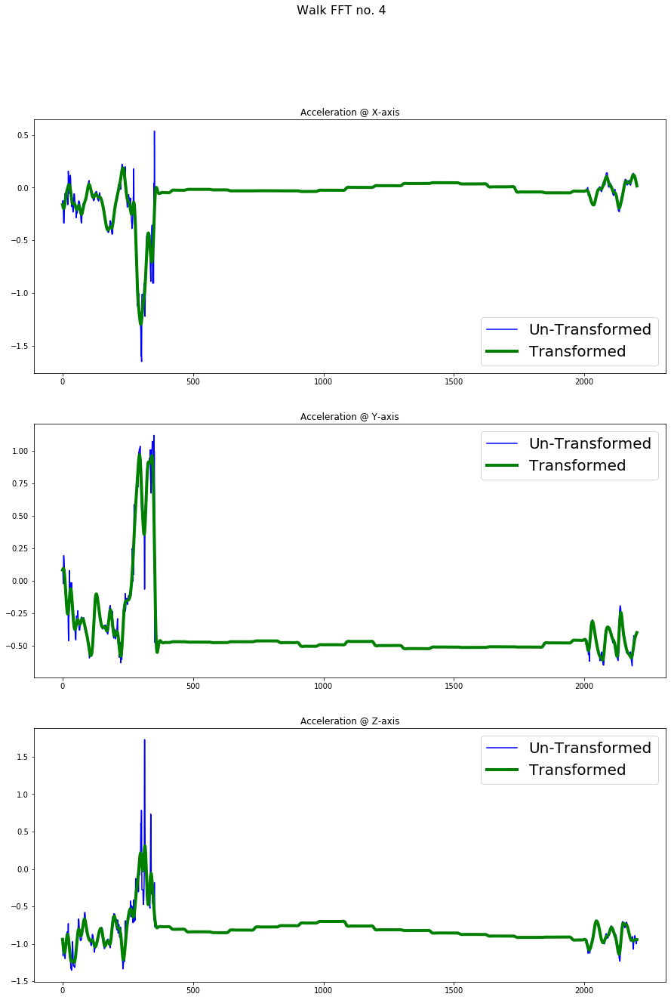

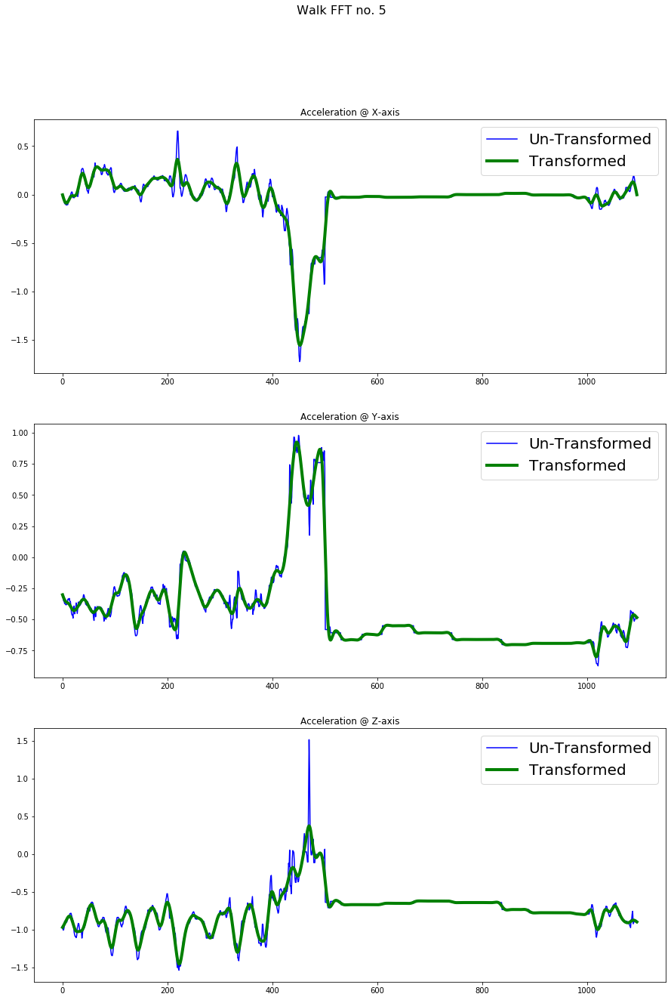

...

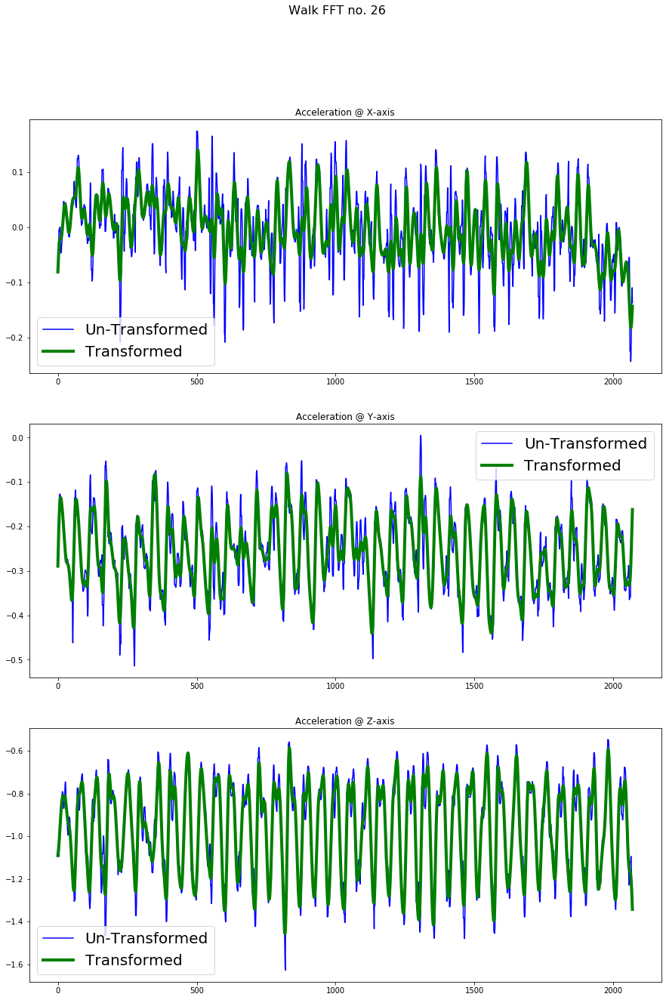

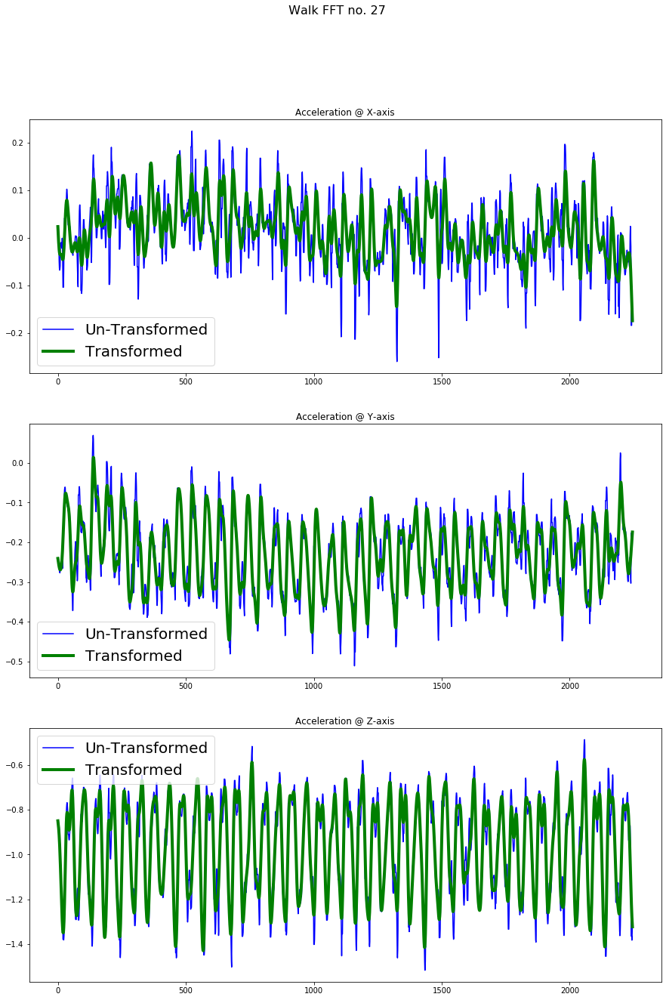

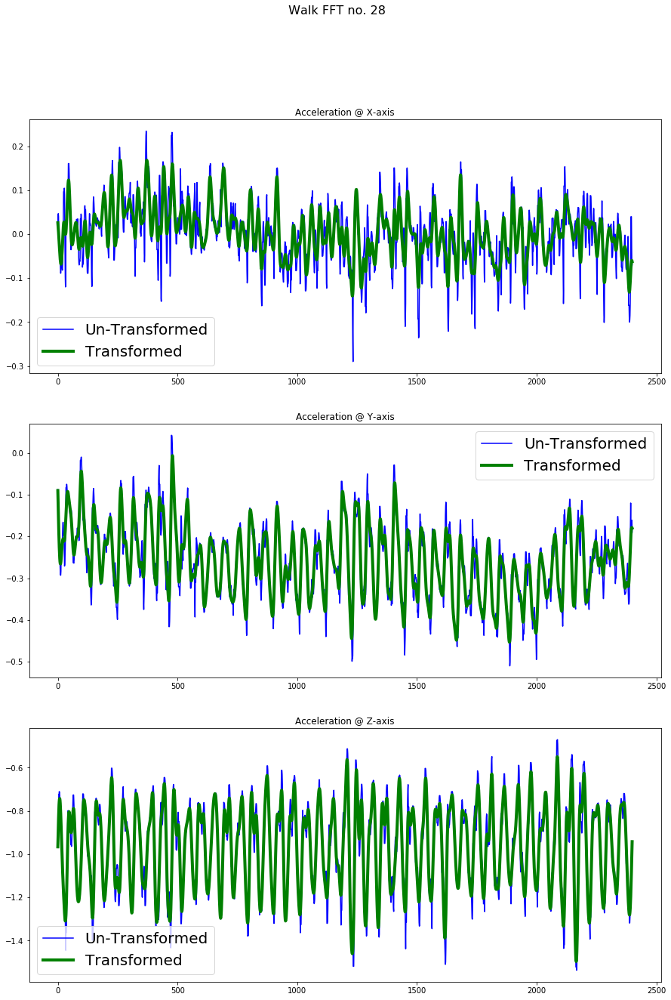

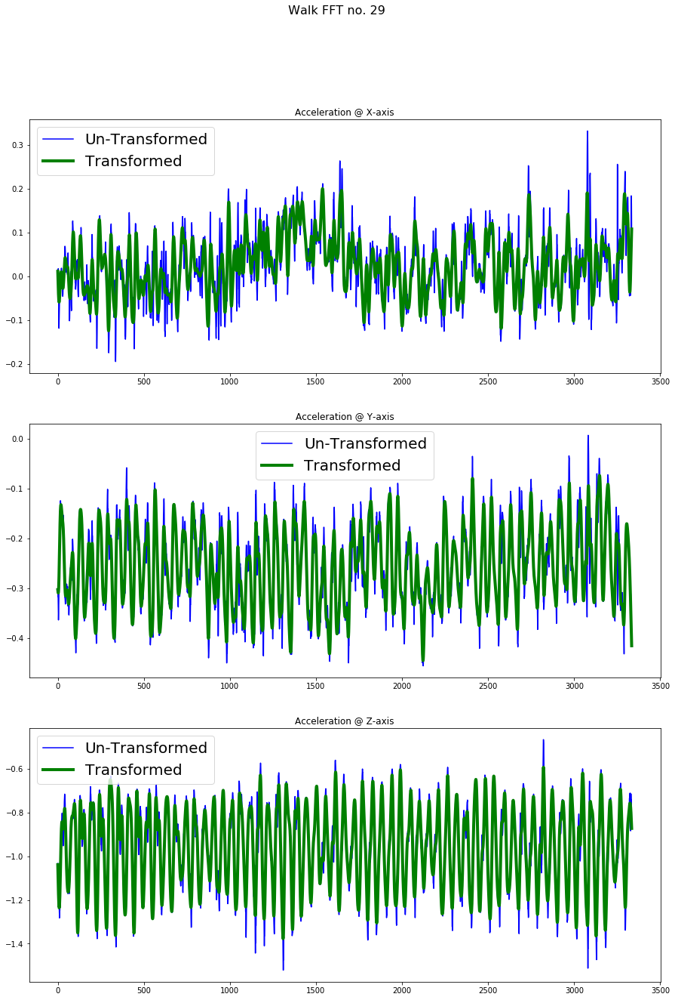

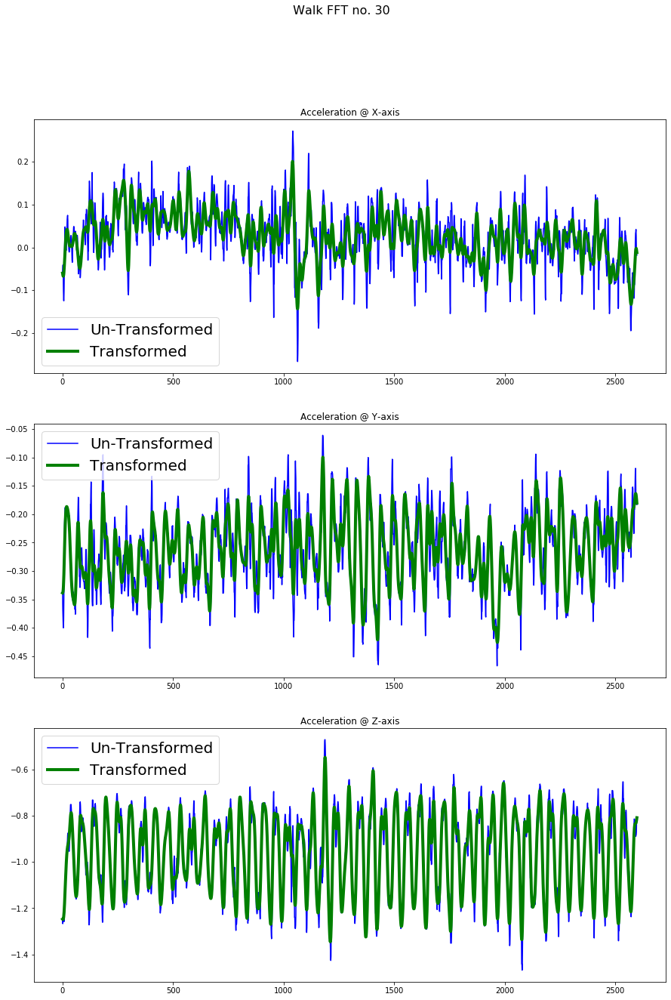

In [33]:
for i in range (30):
    fig, ax = plt.subplots(3,figsize=(15,21))
    
    fig.suptitle(' Walk FFT no. {}'.format(i+1), fontsize=16)
    
    ax[0].plot(walk_np[i]["gFx"],'blue',label='Un-Transformed')
    ax[0].plot(butter_worth_walk[i]["AccX"],'green', label='Transformed', linewidth=4.0)
    ax[0].legend(fontsize=20)
    ax[0].title.set_text('Acceleration @ X-axis')
    
    ax[1].plot(walk_np[i]["gFy"],'blue',label='Un-Transformed')
    ax[1].plot(butter_worth_walk[i]["AccY"],'green', label='Transformed', linewidth=4.0)
    ax[1].legend(fontsize=20)
    ax[1].title.set_text('Acceleration @ Y-axis')
    
    ax[2].plot(walk_np[i]["gFz"],'blue',label='Un-Transformed')
    ax[2].plot(butter_worth_walk[i]["AccZ"],'green', label='Transformed', linewidth=4.0)
    ax[2].legend(fontsize=20)
    ax[2].title.set_text('Acceleration @ Z-axis')
    
  
    
 

In [34]:
####Save the  walking transformed/cleaned data over here

for i in range(30):
    butter_worth_walk[i].to_csv("data/cleaned/walking/walk{}.csv".format(i+1), sep = ';',index=False)

In [15]:
#### standing Data cleaning starts here

In [37]:
butter_worth_standing = []
for i in range(30):
    butter_worth_standingX = signal.filtfilt(b, a, standing_np[i]["gFx"])
    butter_worth_standingY = signal.filtfilt(b, a, standing_np[i]["gFy"])
    butter_worth_standingZ = signal.filtfilt(b, a, standing_np[i]["gFz"])
    #butter_worth_walk_L =signal.filtfilt(b, a,walk_np[i]["acc"])
    
    
    butter_worth_standing.append((pd.DataFrame(list(zip(standing_np[i]['time'],butter_worth_standingX, butter_worth_standingY, butter_worth_standingZ,standing_np[i]['acc'])),
                                            columns=["Time","AccX", "AccY", "AccZ","Acc-old"])))
    
    
    
    

In [38]:
for i in range(30):
    butter_worth_standing[i]["Acc-trns"] = np.sqrt(butter_worth_standing[i]["AccX"]**2 * 
                                                     butter_worth_standing[i]["AccY"]**2 *
                                                     butter_worth_standing[i]["AccZ"]**2 ) 
    
butter_worth_standing[0]

,Time,AccX,AccY,AccZ,Acc-old,Acc-trns
0,56:10.0,0.024733,-0.418209,-0.853952,0.951,0.008833
1,56:10.0,0.023744,-0.419375,-0.871900,0.956,0.008682
2,56:10.0,0.022700,-0.420530,-0.889025,1.011,0.008487
3,56:10.1,0.021531,-0.421664,-0.904523,1.043,0.008212
4,56:10.1,0.020190,-0.422769,-0.917745,1.051,0.007834
...,...,...,...,...,...,...
1735,56:27.3,0.000684,-0.402660,-0.915092,1.006,0.000252
1736,56:27.3,0.002159,-0.401412,-0.917986,1.006,0.000796
1737,56:27.3,0.003666,-0.400154,-0.920879,1.008,0.001351
1738,56:27.3,0.005179,-0.398919,-0.923682,1.010,0.001908


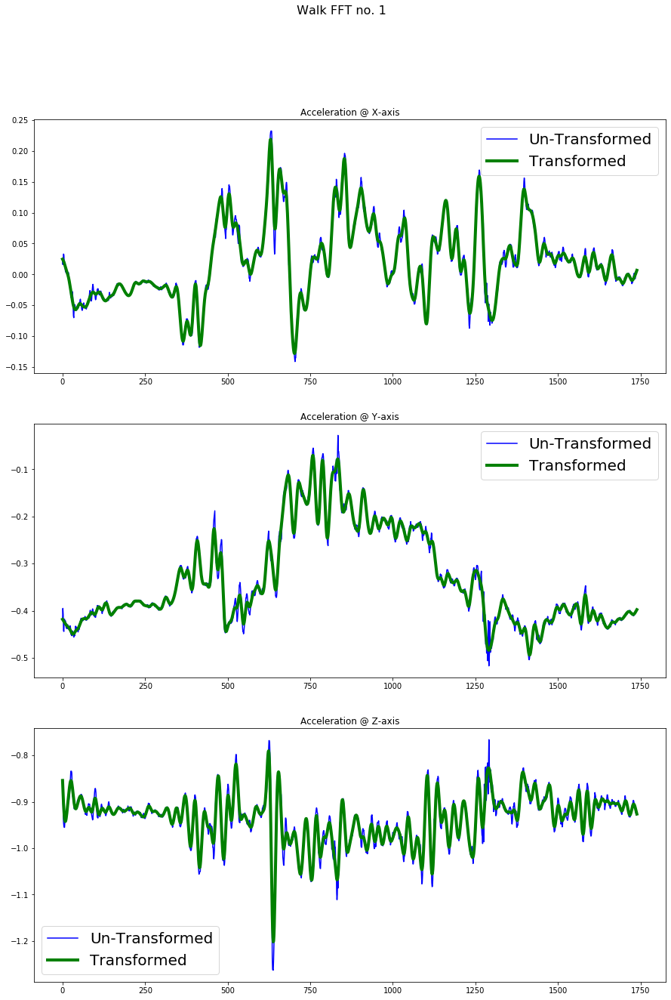

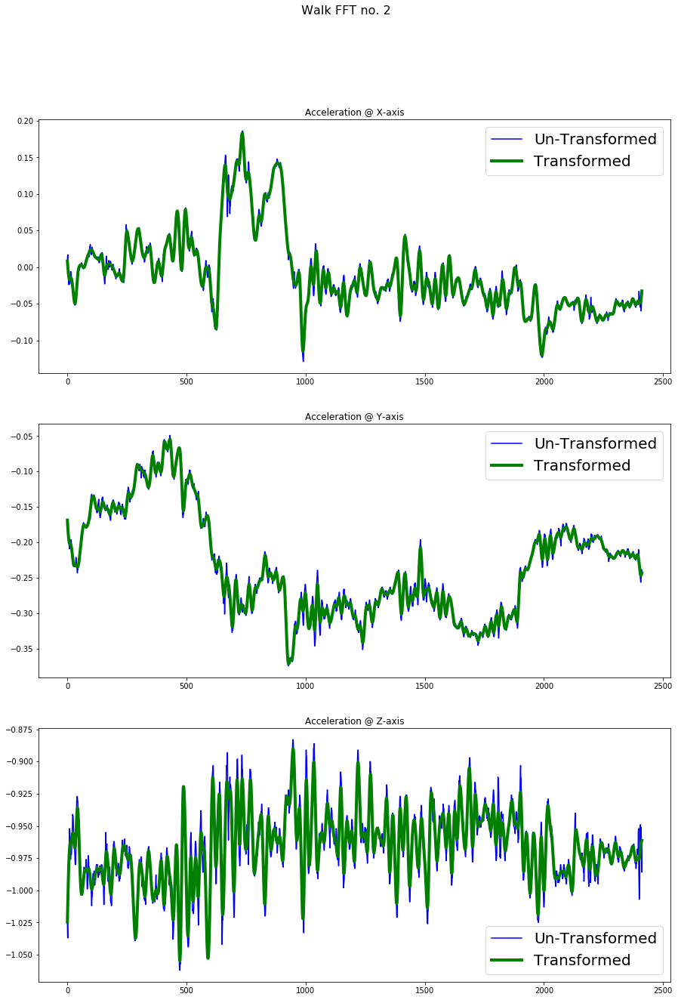

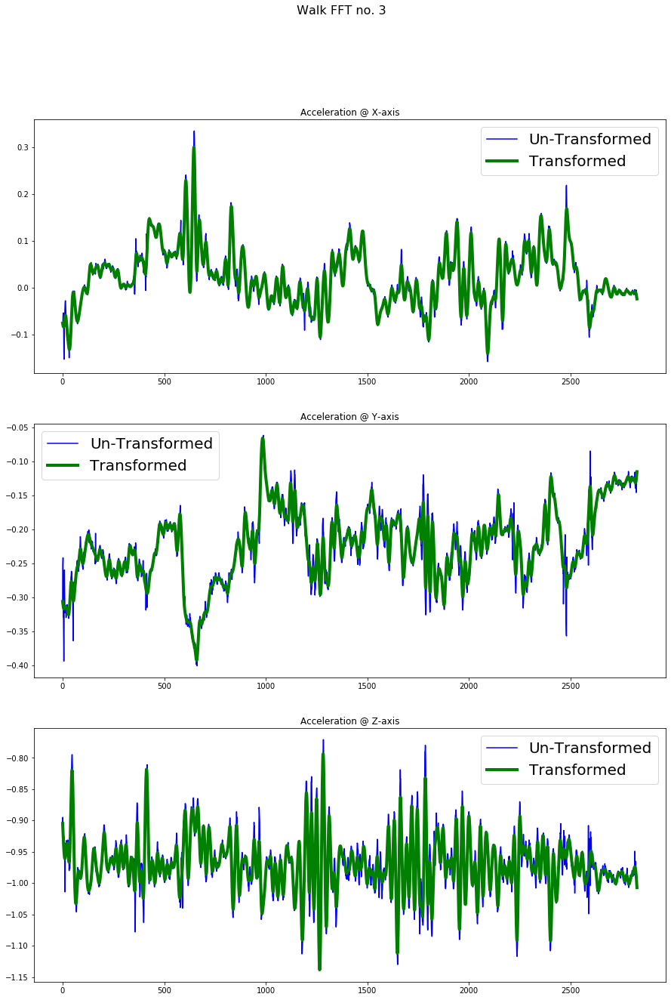

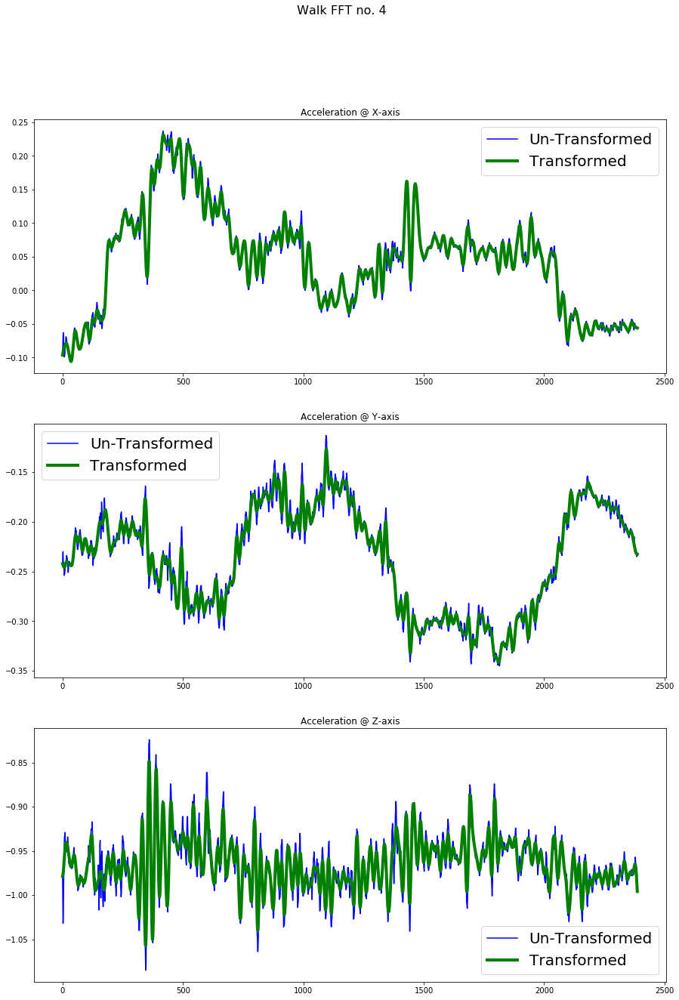

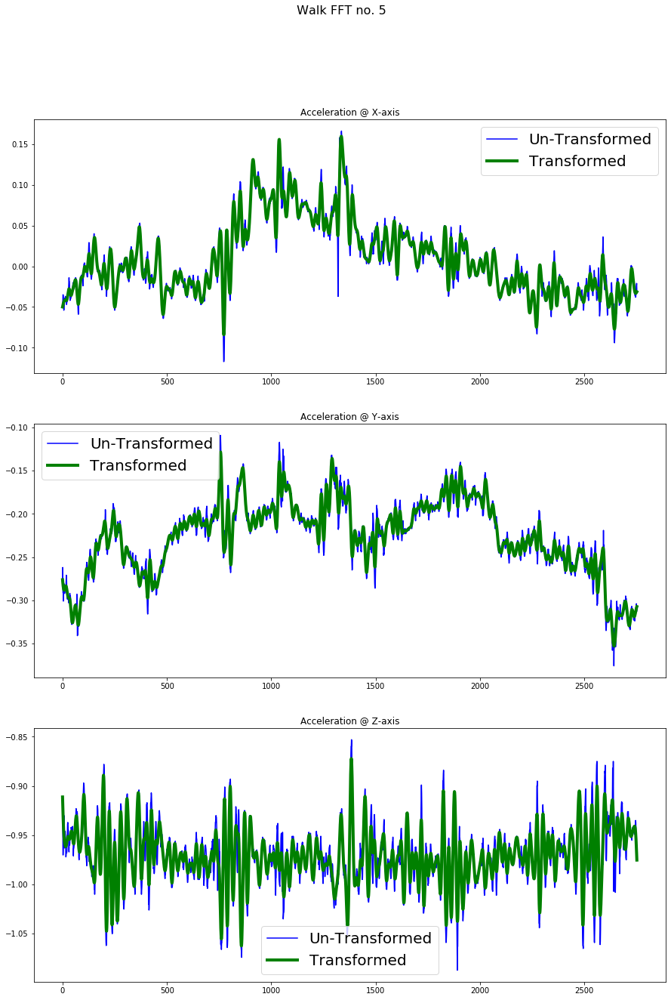

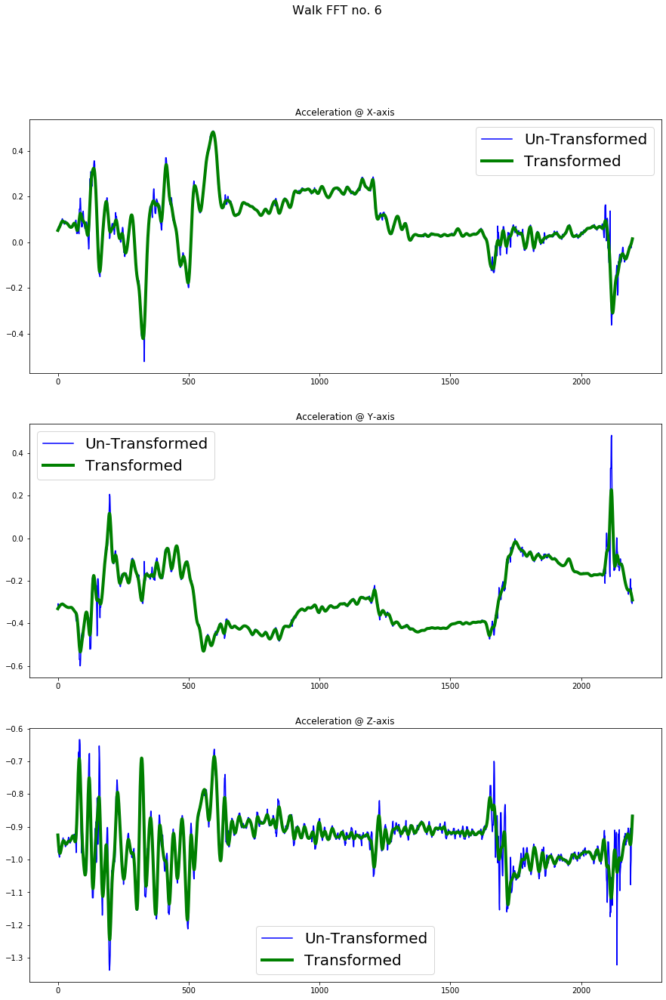

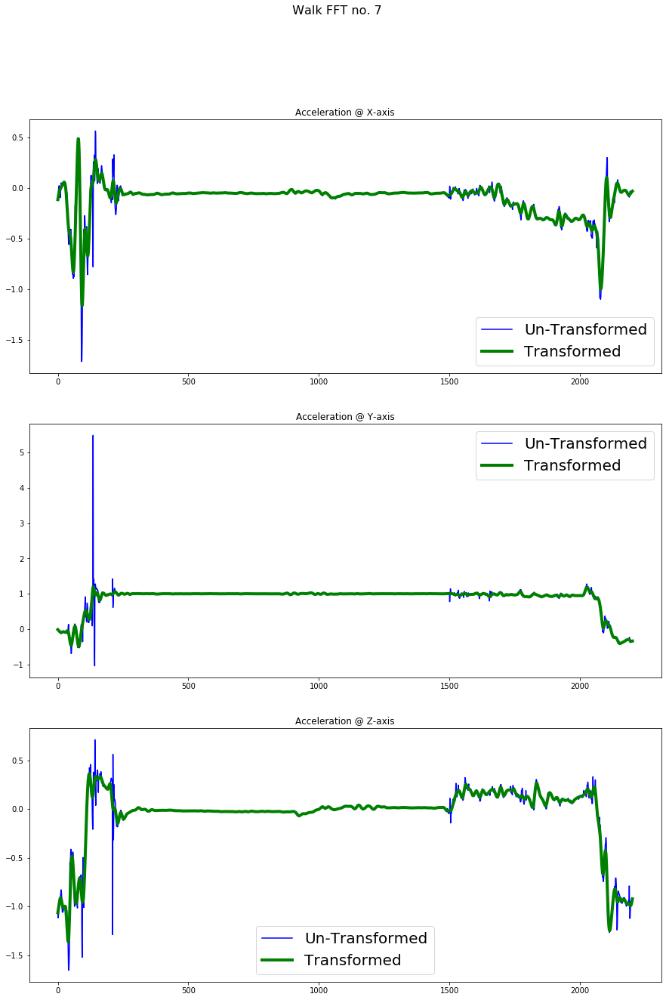

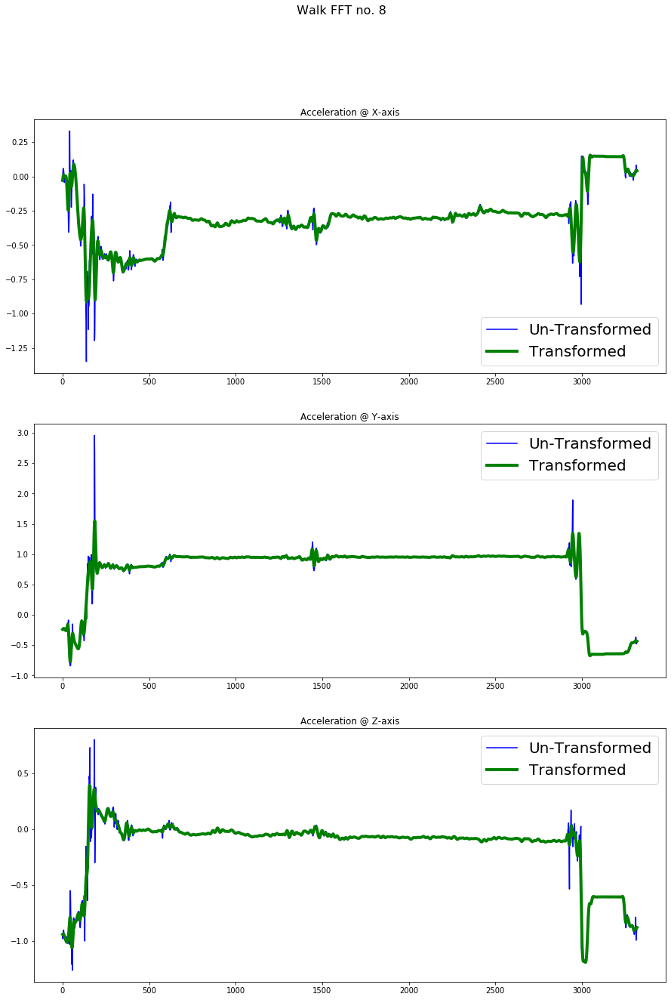

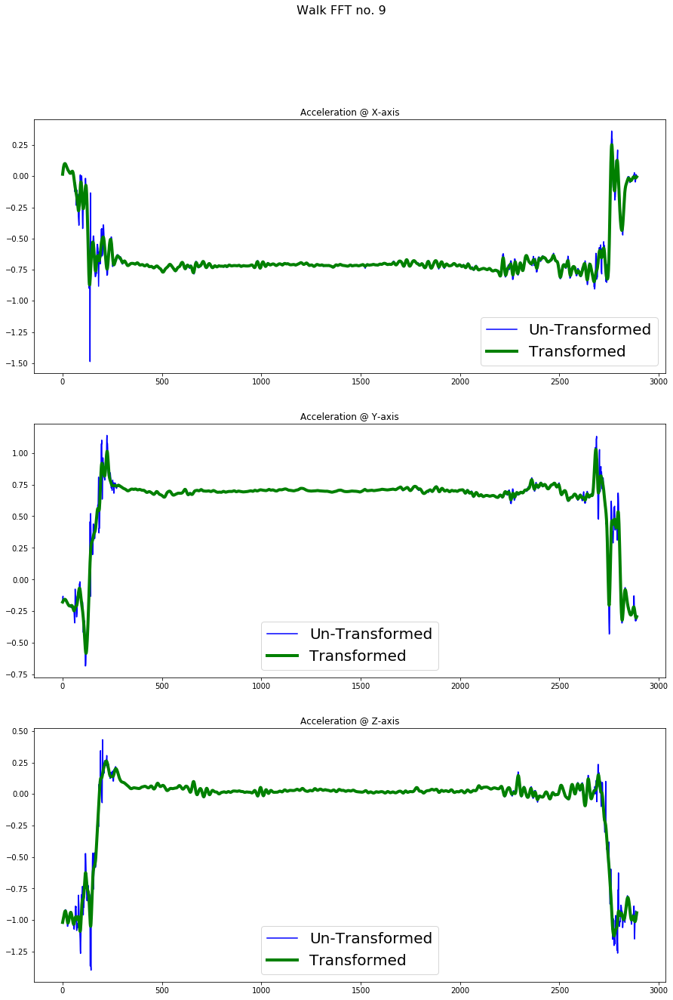

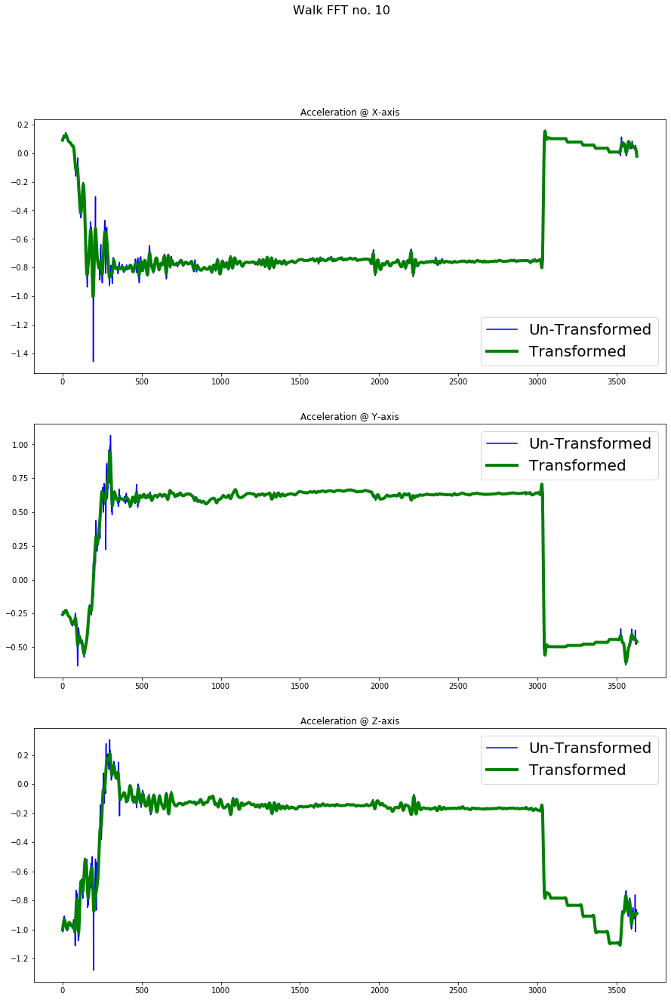

In [39]:
#####Transformations for Standing

for i in range (10):
    fig, ax = plt.subplots(3,figsize=(15,21))
    
    fig.suptitle(' Walk FFT no. {}'.format(i+1), fontsize=16)
    
    ax[0].plot(standing_np[i]["gFx"],'blue',label='Un-Transformed')
    ax[0].plot(butter_worth_standing[i]["AccX"],'green', label='Transformed', linewidth=4.0)
    ax[0].legend(fontsize=20)
    ax[0].title.set_text('Acceleration @ X-axis')
    
    ax[1].plot(standing_np[i]["gFy"],'blue',label='Un-Transformed')
    ax[1].plot(butter_worth_standing[i]["AccY"],'green', label='Transformed', linewidth=4.0)
    ax[1].legend(fontsize=20)
    ax[1].title.set_text('Acceleration @ Y-axis')
    
    ax[2].plot(standing_np[i]["gFz"],'blue',label='Un-Transformed')
    ax[2].plot(butter_worth_standing[i]["AccZ"],'green', label='Transformed', linewidth=4.0)
    ax[2].legend(fontsize=20)
    ax[2].title.set_text('Acceleration @ Z-axis')
    

In [40]:
########Save the standing Cleaned/Transformed data here ######
for i in range(30):
    butter_worth_standing[i].to_csv("data/cleaned/standing/standing{}.csv".format(i+1), sep = ';',index=False)

In [20]:
#### Running Data cleaning starts here


butter_worth_running = []
for i in range(10):
    butter_worth_runningX = signal.filtfilt(b, a, running_np[i]["gFx"])
    butter_worth_runningY = signal.filtfilt(b, a, running_np[i]["gFy"])
    butter_worth_runningZ = signal.filtfilt(b, a, running_np[i]["gFz"])
    #butter_worth_walk_L =signal.filtfilt(b, a,walk_np[i]["acc"])
    
    
    butter_worth_running.append((pd.DataFrame(list(zip(running_np[i]['time'],butter_worth_runningX, butter_worth_runningY, butter_worth_runningZ,running_np[i]['acc'])),
                                            columns=["Time","AccX", "AccY", "AccZ","Acc-old"])))
    


In [21]:
for i in range(10):
    butter_worth_running[i]["Acc-trns"] = np.sqrt(butter_worth_running[i]["AccX"]**2 * 
                                                     butter_worth_running[i]["AccY"]**2 *
                                                     butter_worth_running[i]["AccZ"]**2 ) 
    


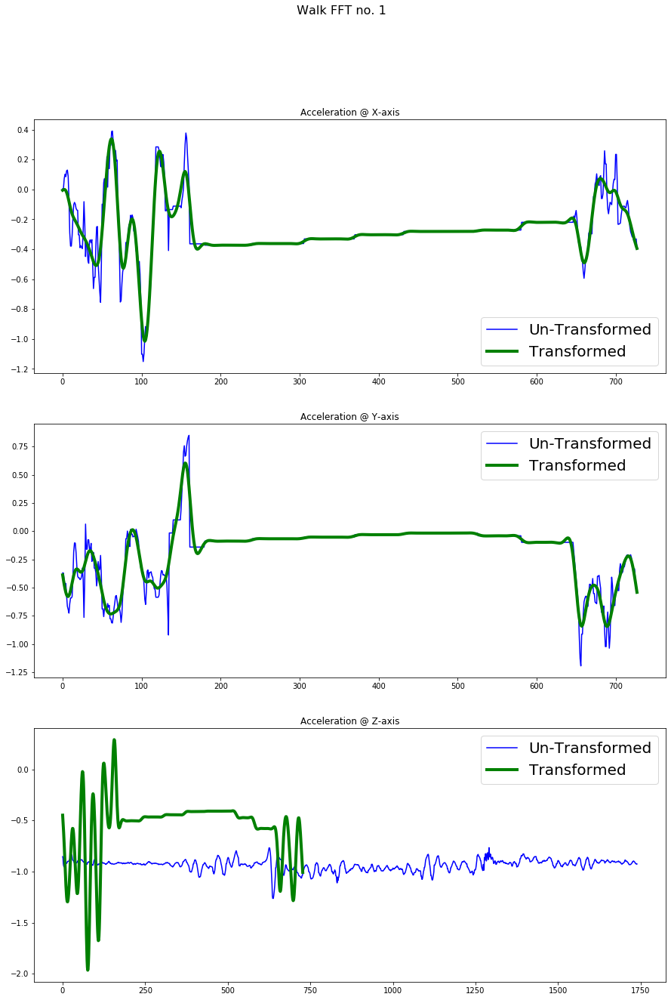

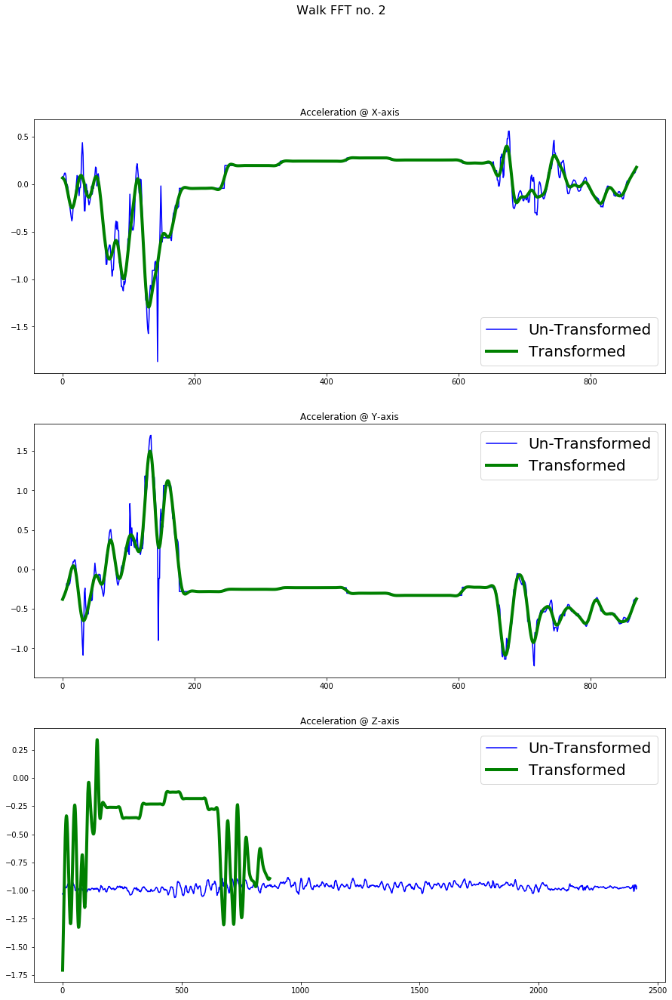

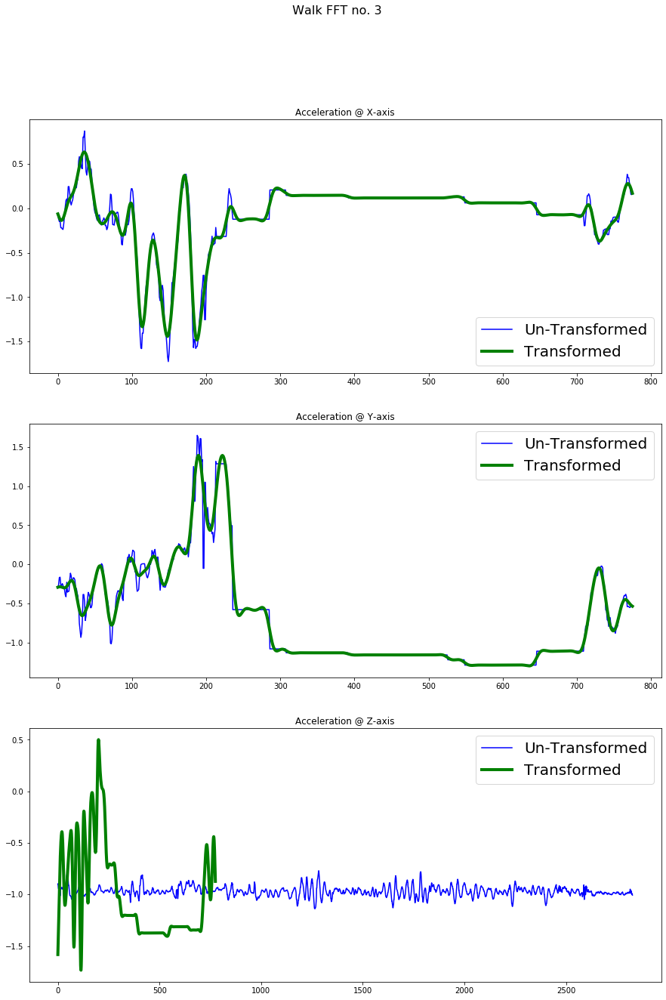

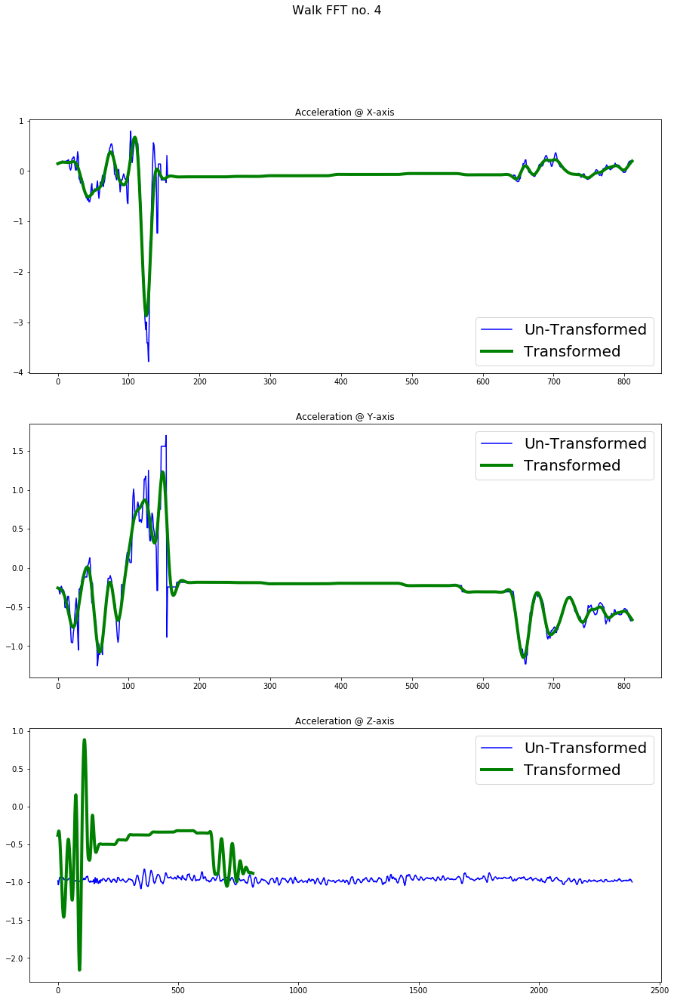

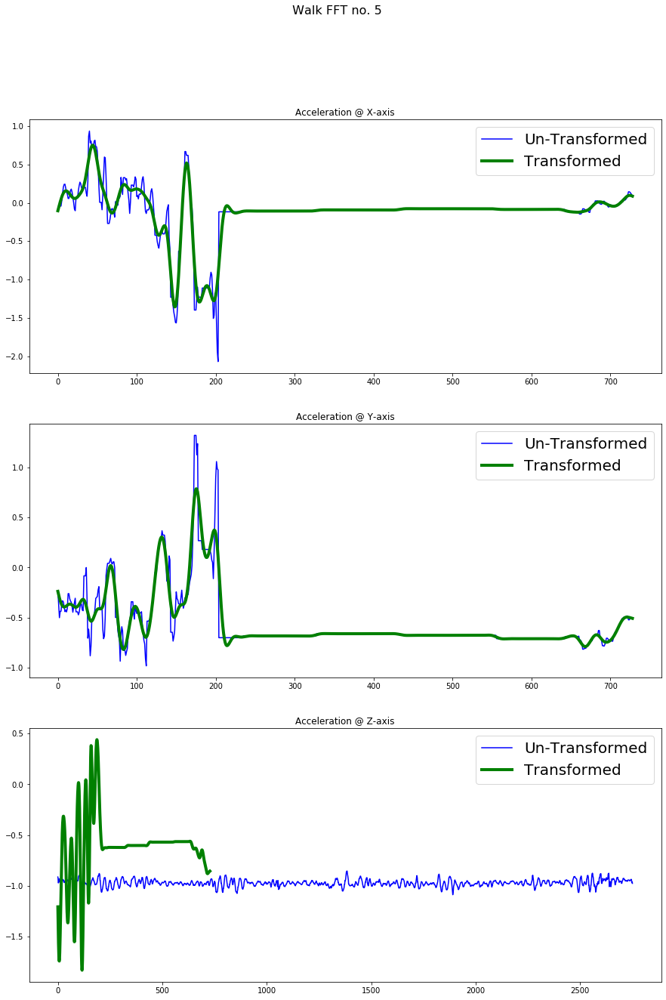

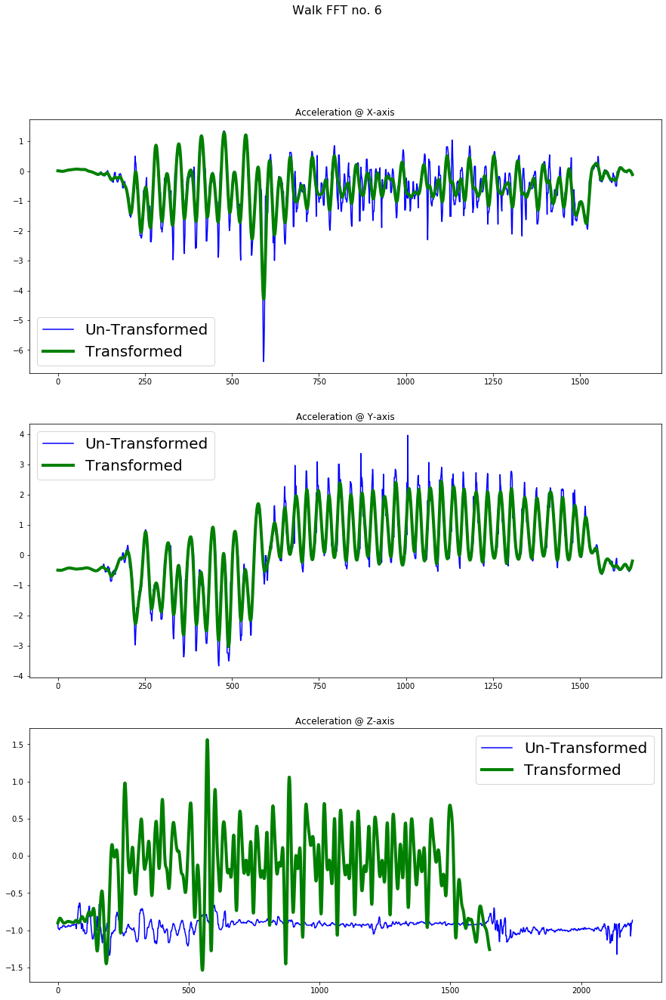

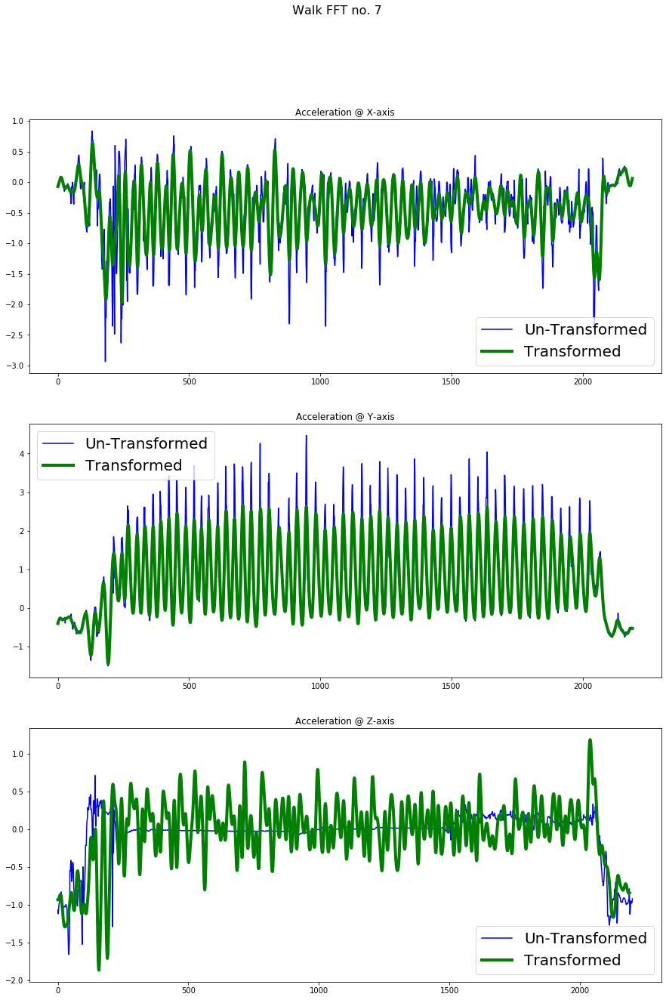

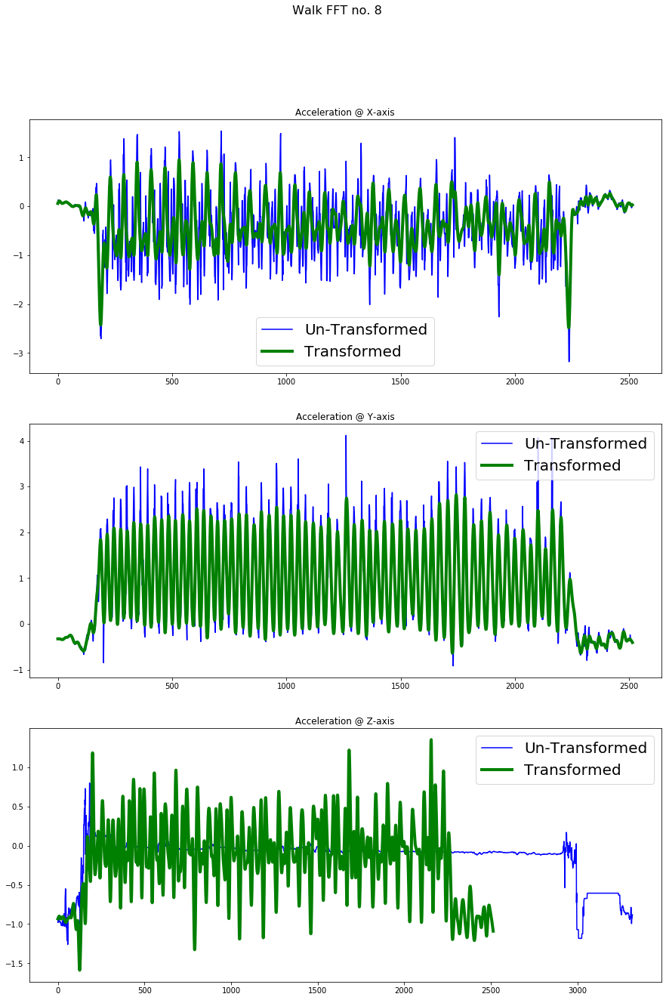

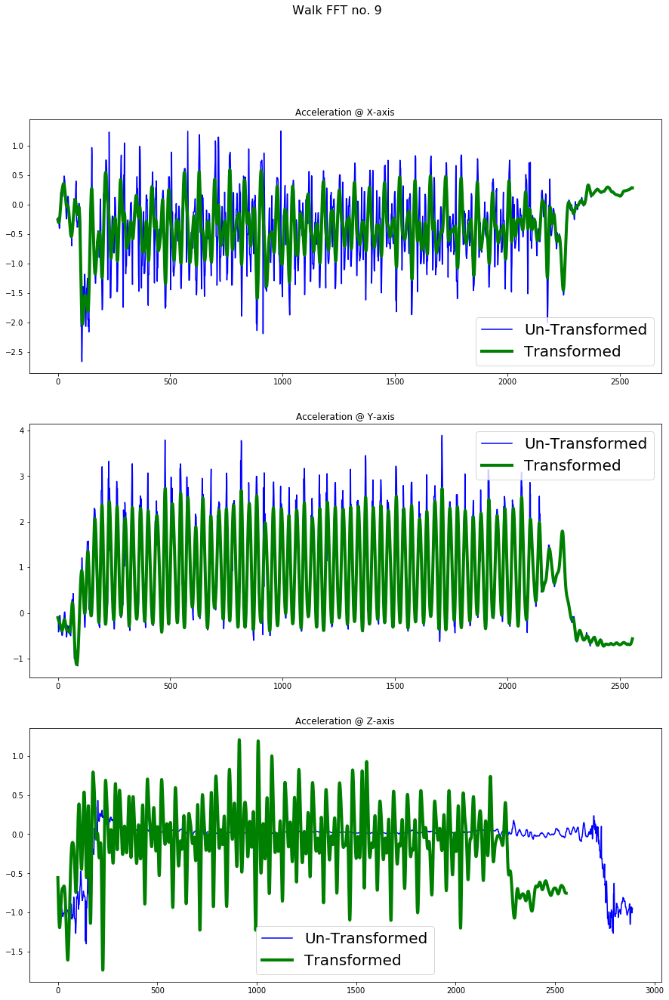

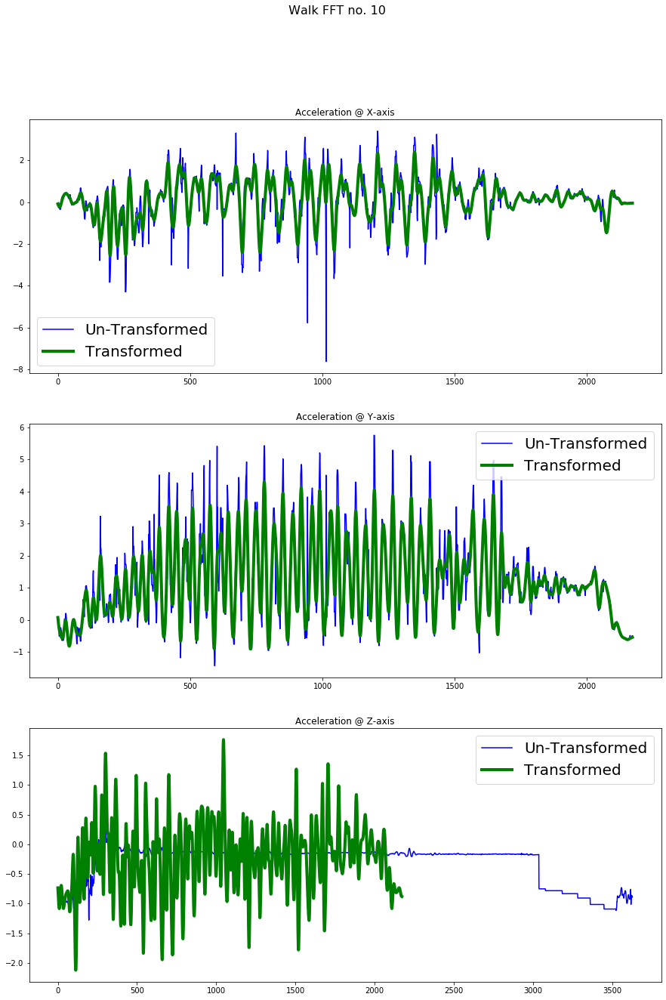

In [22]:
#####Transformations for running

for i in range (10):
    fig, ax = plt.subplots(3,figsize=(15,21))
    
    fig.suptitle(' Walk FFT no. {}'.format(i+1), fontsize=16)
    
    ax[0].plot(running_np[i]["gFx"],'blue',label='Un-Transformed')
    ax[0].plot(butter_worth_running[i]["AccX"],'green', label='Transformed', linewidth=4.0)
    ax[0].legend(fontsize=20)
    ax[0].title.set_text('Acceleration @ X-axis')
    
    ax[1].plot(running_np[i]["gFy"],'blue',label='Un-Transformed')
    ax[1].plot(butter_worth_running[i]["AccY"],'green', label='Transformed', linewidth=4.0)
    ax[1].legend(fontsize=20)
    ax[1].title.set_text('Acceleration @ Y-axis')
    
    ax[2].plot(standing_np[i]["gFz"],'blue',label='Un-Transformed')
    ax[2].plot(butter_worth_running[i]["AccZ"],'green', label='Transformed', linewidth=4.0)
    ax[2].legend(fontsize=20)
    ax[2].title.set_text('Acceleration @ Z-axis')
    

In [23]:
########Save the running Cleaned/Transformed data here ######
for i in range(10):
    butter_worth_running[i].to_csv("cleaned/running{}.csv".format(i+1), sep = ';',index=False)